In [168]:
from pymongo import MongoClient
from bson.objectid import ObjectId
import datetime
import sys

#the week number 
WeekNumber = 1

# connection
conn = MongoClient("mongodb://104.155.227.109:27017") 
db = conn.test
video_records = db.video_records
exercise_records = db.exercise_records
kmap_records = db.kmap_records


# test if connection success
video_records.stats  

Collection(Database(MongoClient(host=['104.155.227.109:27017'], document_class=dict, tz_aware=False, connect=True), 'test'), 'video_records.stats')

In [169]:
import math
#user information
#userId = 146298
courseId = 1620
starttime = datetime.datetime.now()
endtime = datetime.datetime.now()

In [170]:
import pymysql
db = pymysql.connect(host ='35.194.130.50'
                     ,user = 'signalsystem'
                     ,password = 'netxtream'
                     ,db = 'db_sharecourse'
                     )
#,port = 3306 , charset='utf8_genearl_ci'

cursor = db.cursor()


# SQL 查询语句
cursor.execute("SELECT start_time,end_time,name FROM course WHERE id = %d" % courseId)
results = cursor.fetchall()
for row in results:
    starttime = row[0]
    endtime = row[1]
    course_name = row[2]
    
print(starttime)
print(endtime)
print(course_name)

#get the chid of the course
chid = []
cursor.execute("SELECT id FROM chapter WHERE cid = %d AND  `publish` =1" % courseId)
results2 = cursor.fetchall()
for a in results2:
    chid.append(a[0])


    

wholeTime = endtime - starttime
courseDays = wholeTime.days
courseWeeks = int(math.ceil(courseDays/7))
weekStarttime = starttime + datetime.timedelta(days = 7*(WeekNumber - 1))
weekEndtime = starttime + datetime.timedelta(days = 7*WeekNumber) 
print('chid : ',chid)
print('The time of the week start : ',weekStarttime)
print('The time of the week end : ',weekEndtime)
print('courseWeeks: ',courseWeeks)

'''把 uid 從 phpadmin 拉下來 才可以知道修課總人數 然後有幾個人 完成影片點擊 '''
uid = []
oneMonth = datetime.timedelta(days = 30)
twoWeeks = datetime.timedelta(days = 14)
cursor.execute("SELECT uid FROM reservation WHERE cid = %d AND reserve_time > '%s' AND reserve_time < '%s'" % (courseId,weekStarttime - oneMonth,weekStarttime + twoWeeks))
results3 = cursor.fetchall()
for a in results3:
    uid.append(a[0])
print('the date for the first reservation: %s' % (weekStarttime - oneMonth))
print('the date for the last reservation: %s' % (weekStarttime + twoWeeks))
print('uid: ',uid)
print(len(uid))

'''###########將video id 從 phpmyadmin 拉下來#############'''
video_id = []
cursor.execute("SELECT id FROM video_list WHERE chid = %d " % chid[WeekNumber])
results4 = cursor.fetchall()
for a in results4:
     video_id.append(a[0])
video_id

2018-09-10 00:00:00
2018-11-19 00:00:00
2018秋季 計算機網路概論<br />Introduction to Computer Networks
chid :  [10406, 10407, 10408, 10409, 10410, 10411, 10412, 10413, 10414]
The time of the week start :  2018-09-10 00:00:00
The time of the week end :  2018-09-17 00:00:00
courseWeeks:  10
the date for the first reservation: 2018-08-11 00:00:00
the date for the last reservation: 2018-09-24 00:00:00
uid:  [7089, 64785, 2891, 26979, 326, 38506, 57726, 144232, 11275, 38237, 144113, 144234, 68997, 63723, 15248, 12152, 85018, 16308, 34669, 64358, 39489, 134072, 38728, 25854, 42441, 31727, 50638, 144244, 144246, 37454, 31847, 141574, 24903, 38501, 143819, 30806, 67487, 31047, 144253, 3932, 12474, 27783, 140524, 144256, 97207, 140053, 110619, 36810, 46451, 49220, 144263, 37441, 30051, 144267, 144268, 14774, 46413, 137462, 33768, 6591, 79799, 78050, 24144, 85546, 132404, 144297, 144299, 144300, 130776, 4230, 102868, 144301, 39095, 558, 144287, 26085, 75398, 47747, 38236, 25507, 38747, 144961, 77366, 144

[60054,
 60055,
 60056,
 60057,
 60058,
 60059,
 60060,
 60061,
 60062,
 60063,
 60064,
 60065,
 60066,
 60067,
 60068]

In [171]:
print('%s' % ('2018-08-22 22:26:43'))

2018-08-22 22:26:43


In [172]:
if video_records.find_one({"courseId":courseId}) is None:
    print("userId or courseId doesn't exist")
    isQueryCorrect = False

In [173]:
for a in video_records.find({"courseId":courseId}):
    if a["time"] < weekEndtime and a["time"] > weekStarttime:
        print(a)

{'_id': ObjectId('5b967f4d60ce9a9520910a6d'), 'action': 'play', 'userId': 128000, 'userAccount': 'angus88727@gmail.com', 'videoStartTime': 0, 'videoEndTime': None, 'videoId': None, 'videoTotalTime': 99, 'courseId': 1620, 'chapterId': 10406, 'chapterVideoCount': 1, 'chapterVideoOrder': 1, 'playRate': 1, 'time': datetime.datetime(2018, 9, 10, 14, 27, 25, 34000), '__v': 0}
{'_id': ObjectId('5b967f4f60ce9a9520910a70'), 'action': 'play', 'userId': 128000, 'userAccount': 'angus88727@gmail.com', 'videoStartTime': 0.0324130114440918, 'videoEndTime': None, 'videoId': None, 'videoTotalTime': 99, 'courseId': 1620, 'chapterId': 10406, 'chapterVideoCount': 1, 'chapterVideoOrder': 1, 'playRate': 1, 'time': datetime.datetime(2018, 9, 10, 14, 27, 27, 965000), '__v': 0}
{'_id': ObjectId('5b967f7260ce9a9520910a8a'), 'action': 'pause', 'userId': 128000, 'userAccount': 'angus88727@gmail.com', 'videoStartTime': 37.50408908045977, 'videoEndTime': None, 'videoId': None, 'videoTotalTime': 99, 'courseId': 1620

{'_id': ObjectId('5b968aae60ce9a9520911114'), 'action': 'change_rate', 'userId': 146298, 'userAccount': 'sharon880701@gmail.com', 'videoStartTime': 8.952495714, 'videoEndTime': None, 'videoId': 60054, 'videoTotalTime': 784, 'courseId': 1620, 'chapterId': 10407, 'chapterVideoCount': 15, 'chapterVideoOrder': 1, 'playRate': 1.5, 'time': datetime.datetime(2018, 9, 10, 15, 15, 58, 165000), '__v': 0}
{'_id': ObjectId('5b968adf60ce9a952091113c'), 'action': 'pause', 'userId': 146298, 'userAccount': 'sharon880701@gmail.com', 'videoStartTime': 82.35314703, 'videoEndTime': None, 'videoId': 60054, 'videoTotalTime': 784, 'courseId': 1620, 'chapterId': 10407, 'chapterVideoCount': 15, 'chapterVideoOrder': 1, 'playRate': 1.5, 'time': datetime.datetime(2018, 9, 10, 15, 16, 47, 473000), '__v': 0}
{'_id': ObjectId('5b968b0f60ce9a952091114d'), 'action': 'play', 'userId': 64189, 'userAccount': 'hghghg850@yahoo.com.tw', 'videoStartTime': 0, 'videoEndTime': None, 'videoId': None, 'videoTotalTime': 99, 'cours

{'_id': ObjectId('5b97bf6b60ce9a952091f455'), 'action': 'play', 'userId': 146354, 'userAccount': 'louis6591342@gmail.com', 'videoStartTime': 42.57863892752075, 'videoEndTime': None, 'videoId': 60057, 'videoTotalTime': 1140, 'courseId': 1620, 'chapterId': 10407, 'chapterVideoCount': 15, 'chapterVideoOrder': 4, 'playRate': 1, 'time': datetime.datetime(2018, 9, 11, 13, 13, 15, 639000), '__v': 0}
{'_id': ObjectId('5b97bf6c60ce9a952091f458'), 'action': 'pause', 'userId': 146354, 'userAccount': 'louis6591342@gmail.com', 'videoStartTime': 43.343824, 'videoEndTime': None, 'videoId': 60057, 'videoTotalTime': 1140, 'courseId': 1620, 'chapterId': 10407, 'chapterVideoCount': 15, 'chapterVideoOrder': 4, 'playRate': 1, 'time': datetime.datetime(2018, 9, 11, 13, 13, 16, 656000), '__v': 0}
{'_id': ObjectId('5b97bf7060ce9a952091f460'), 'action': 'play', 'userId': 146354, 'userAccount': 'louis6591342@gmail.com', 'videoStartTime': 43.425080020980836, 'videoEndTime': None, 'videoId': 60057, 'videoTotalTim

{'_id': ObjectId('5b988d0560ce9a952092b0a1'), 'action': 'play', 'userId': 146158, 'userAccount': 'dges51103@gmail.com', 'videoStartTime': 0.024811876022338867, 'videoEndTime': None, 'videoId': None, 'videoTotalTime': 99, 'courseId': 1620, 'chapterId': 10406, 'chapterVideoCount': 1, 'chapterVideoOrder': 1, 'playRate': 1, 'time': datetime.datetime(2018, 9, 12, 3, 50, 29, 585000), '__v': 0}
{'_id': ObjectId('5b988d0760ce9a952092b0a7'), 'action': 'pause', 'userId': 146158, 'userAccount': 'dges51103@gmail.com', 'videoStartTime': 2.057364, 'videoEndTime': None, 'videoId': None, 'videoTotalTime': 99, 'courseId': 1620, 'chapterId': 10406, 'chapterVideoCount': 1, 'chapterVideoOrder': 1, 'playRate': 1, 'time': datetime.datetime(2018, 9, 12, 3, 50, 31, 746000), '__v': 0}
{'_id': ObjectId('5b988d0a60ce9a952092b0ac'), 'action': 'play', 'userId': 127101, 'userAccount': 'garyskyking0908@gmail.com', 'videoStartTime': 265.1072778474121, 'videoEndTime': None, 'videoId': 60055, 'videoTotalTime': 1084, 'c

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{'_id': ObjectId('5b9e14e260ce9a95209a5b61'), 'action': 'play', 'userId': 146627, 'userAccount': 'd0649367@fcu.edu.tw', 'videoStartTime': 0, 'videoEndTime': None, 'videoId': 60062, 'videoTotalTime': 1126, 'courseId': 1620, 'chapterId': 10407, 'chapterVideoCount': 15, 'chapterVideoOrder': 9, 'playRate': 1, 'time': datetime.datetime(2018, 9, 16, 8, 31, 30, 668000), '__v': 0}
{'_id': ObjectId('5b9e14e360ce9a95209a5b68'), 'action': 'play', 'userId': 146627, 'userAccount': 'd0649367@fcu.edu.tw', 'videoStartTime': 0, 'videoEndTime': None, 'videoId': 60062, 'videoTotalTime': 1126, 'courseId': 1620, 'chapterId': 10407, 'chapterVideoCount': 15, 'chapterVideoOrder': 9, 'playRate': 1, 'time': datetime.datetime(2018, 9, 16, 8, 31, 31, 401000), '__v': 0}
{'_id': ObjectId('5b9e14e360ce9a95209a5b6a'), 'action': 'play', 'userId': 146627, 'userAccount': 'd0649367@fcu.edu.tw', 'videoStartTime': 0.06290099046325684, 'videoEndTime': None, 'videoId': 60062, 'videoTotalTime': 1126, 'courseId': 1620, 'chapt

{'_id': ObjectId('5b9e38b960ce9a95209ac967'), 'action': 'pause', 'userId': 117697, 'userAccount': 'kyta.033011@gmail.com', 'videoStartTime': 542.825417, 'videoEndTime': None, 'videoId': 60058, 'videoTotalTime': 897, 'courseId': 1620, 'chapterId': 10407, 'chapterVideoCount': 15, 'chapterVideoOrder': 5, 'playRate': 2, 'time': datetime.datetime(2018, 9, 16, 11, 4, 25, 467000), '__v': 0}
{'_id': ObjectId('5b9e38ba60ce9a95209ac96b'), 'action': 'seek', 'userId': 117697, 'userAccount': 'kyta.033011@gmail.com', 'videoStartTime': 528.1237488664856, 'videoEndTime': 542.825417, 'videoId': 60058, 'videoTotalTime': 897, 'courseId': 1620, 'chapterId': 10407, 'chapterVideoCount': 15, 'chapterVideoOrder': 5, 'playRate': 2, 'time': datetime.datetime(2018, 9, 16, 11, 4, 26, 29000), '__v': 0}
{'_id': ObjectId('5b9e38ba60ce9a95209ac96e'), 'action': 'play', 'userId': 117697, 'userAccount': 'kyta.033011@gmail.com', 'videoStartTime': 532.8364493318786, 'videoEndTime': None, 'videoId': 60058, 'videoTotalTime'

{'_id': ObjectId('5b9e628060ce9a95209b530e'), 'action': 'pause', 'userId': 146377, 'userAccount': 'chiahsin0227@gmail.com', 'videoStartTime': 207.758949, 'videoEndTime': None, 'videoId': 60068, 'videoTotalTime': 956, 'courseId': 1620, 'chapterId': 10407, 'chapterVideoCount': 15, 'chapterVideoOrder': 15, 'playRate': 1, 'time': datetime.datetime(2018, 9, 16, 14, 2, 40, 349000), '__v': 0}
{'_id': ObjectId('5b9e629560ce9a95209b5335'), 'action': 'play', 'userId': 146377, 'userAccount': 'chiahsin0227@gmail.com', 'videoStartTime': 207.7609700934601, 'videoEndTime': None, 'videoId': 60068, 'videoTotalTime': 956, 'courseId': 1620, 'chapterId': 10407, 'chapterVideoCount': 15, 'chapterVideoOrder': 15, 'playRate': 1, 'time': datetime.datetime(2018, 9, 16, 14, 3, 1, 633000), '__v': 0}
{'_id': ObjectId('5b9e629660ce9a95209b5338'), 'action': 'play', 'userId': 146313, 'userAccount': 'z002020821@gmail.com', 'videoStartTime': 0, 'videoEndTime': None, 'videoId': None, 'videoTotalTime': 99, 'courseId': 16

{'_id': ObjectId('5b9e6e2260ce9a95209b80e7'), 'action': 'play', 'userId': 146878, 'userAccount': 'imastr114@gmail.com', 'videoStartTime': 196.69639992752076, 'videoEndTime': None, 'videoId': 60058, 'videoTotalTime': 897, 'courseId': 1620, 'chapterId': 10407, 'chapterVideoCount': 15, 'chapterVideoOrder': 5, 'playRate': 1, 'time': datetime.datetime(2018, 9, 16, 14, 52, 18, 103000), '__v': 0}
{'_id': ObjectId('5b9e6e2a60ce9a95209b8108'), 'action': 'pause', 'userId': 145150, 'userAccount': 's711052@gmail.com', 'videoStartTime': 618.135196, 'videoEndTime': None, 'videoId': 60057, 'videoTotalTime': 1140, 'courseId': 1620, 'chapterId': 10407, 'chapterVideoCount': 15, 'chapterVideoOrder': 4, 'playRate': 1, 'time': datetime.datetime(2018, 9, 16, 14, 52, 26, 309000), '__v': 0}
{'_id': ObjectId('5b9e6e2d60ce9a95209b8113'), 'action': 'play', 'userId': 145150, 'userAccount': 's711052@gmail.com', 'videoStartTime': 605.4694318550415, 'videoEndTime': None, 'videoId': 60057, 'videoTotalTime': 1140, 'co

{'_id': ObjectId('5b9e938760ce9a95209c0454'), 'action': 'play', 'userId': 116684, 'userAccount': 'thomas91714@gmail.com', 'videoStartTime': 0.1040668664855957, 'videoEndTime': None, 'videoId': 60055, 'videoTotalTime': 1084, 'courseId': 1620, 'chapterId': 10407, 'chapterVideoCount': 15, 'chapterVideoOrder': 2, 'playRate': 1, 'time': datetime.datetime(2018, 9, 16, 17, 31, 51, 653000), '__v': 0}
{'_id': ObjectId('5b9e93c160ce9a95209c04fd'), 'action': 'play', 'userId': 146518, 'userAccount': 'frank25668528@gmail.com', 'videoStartTime': 309.62516692752075, 'videoEndTime': None, 'videoId': 60057, 'videoTotalTime': 1140, 'courseId': 1620, 'chapterId': 10407, 'chapterVideoCount': 15, 'chapterVideoOrder': 4, 'playRate': 1, 'time': datetime.datetime(2018, 9, 16, 17, 32, 49, 272000), '__v': 0}
{'_id': ObjectId('5b9e93c360ce9a95209c0504'), 'action': 'pause', 'userId': 117697, 'userAccount': 'kyta.033011@gmail.com', 'videoStartTime': 1024.152795, 'videoEndTime': None, 'videoId': 60064, 'videoTotalT

In [174]:
for a in exercise_records.find({"courseId":courseId}):
    print(a)

{'_id': ObjectId('5b838bc960ce9a95207cbe5c'), 'exerciseId': 11806, 'exerciseType': 'checkbox', 'correctAns': '2,4,5', 'execOrder': 1, 'courseId': 1620, 'getScore': False, 'execTotalCount': '2', 'userId': 723, 'time': datetime.datetime(2018, 8, 27, 5, 27, 37, 934000), 'studentAns': [{'0': '2,3,4,'}], '__v': 0}
{'_id': ObjectId('5b9f374260ce9a95209c7a48'), 'exerciseId': 11806, 'exerciseType': 'checkbox', 'correctAns': '2,4,5', 'execOrder': 1, 'courseId': 1620, 'getScore': False, 'execTotalCount': '2', 'userId': 723, 'time': datetime.datetime(2018, 9, 17, 5, 10, 26, 692000), 'studentAns': [{'0': '5,'}], '__v': 0}
{'_id': ObjectId('5b9e1a8560ce9a95209a7698'), 'exerciseId': 11806, 'exerciseType': 'checkbox', 'correctAns': '2,4,5', 'execOrder': 1, 'courseId': 1620, 'getScore': True, 'execTotalCount': '2', 'userId': 999, 'time': datetime.datetime(2018, 9, 16, 8, 55, 33, 501000), 'studentAns': [{'0': '2,4,5,'}], '__v': 0}
{'_id': ObjectId('5b9e1a8860ce9a95209a76a6'), 'exerciseId': 11806, 'exer

{'_id': ObjectId('5bad0a5860ce9a9520b12652'), 'exerciseId': 11828, 'exerciseType': 'text', 'correctAns': '0,1,0,3,0,7', 'execOrder': 1, 'courseId': 1620, 'getScore': True, 'execTotalCount': '1', 'userId': 2595, 'time': datetime.datetime(2018, 9, 27, 16, 50, 32, 434000), 'studentAns': [{'0': '0', '1': '1', '2': '0', '3': '3', '4': '0', '5': '7'}], '__v': 0}
{'_id': ObjectId('5baf1cc460ce9a9520b422c7'), 'exerciseId': 11829, 'exerciseType': 'checkbox', 'correctAns': '1,3', 'execOrder': 1, 'courseId': 1620, 'getScore': False, 'execTotalCount': '1', 'userId': 2595, 'time': datetime.datetime(2018, 9, 29, 6, 33, 40, 403000), 'studentAns': [{'0': '2,3,5,'}], '__v': 0}
{'_id': ObjectId('5baf1cc660ce9a9520b422cf'), 'exerciseId': 11829, 'exerciseType': 'checkbox', 'correctAns': '1,3', 'execOrder': 1, 'courseId': 1620, 'getScore': False, 'execTotalCount': '1', 'userId': 2595, 'time': datetime.datetime(2018, 9, 29, 6, 33, 42, 668000), 'studentAns': [{'0': '2,3,'}], '__v': 0}
{'_id': ObjectId('5baf1

{'_id': ObjectId('5bc88bc8487e0da65e9841c7'), 'exerciseId': 11851, 'exerciseType': 'checkbox', 'correctAns': '1,2,4', 'execOrder': 1, 'courseId': 1620, 'getScore': True, 'execTotalCount': '2', 'userId': 48981, 'time': datetime.datetime(2018, 10, 18, 13, 34, 0, 161000), 'studentAns': [{'0': '1,2,4,'}], '__v': 0}
{'_id': ObjectId('5bc88bf5487e0da65e98420e'), 'exerciseId': 11851, 'exerciseType': 'checkbox', 'correctAns': '2,3,4', 'execOrder': 2, 'courseId': 1620, 'getScore': False, 'execTotalCount': '2', 'userId': 48981, 'time': datetime.datetime(2018, 10, 18, 13, 34, 45, 604000), 'studentAns': [{'0': '3,4,'}], '__v': 0}
{'_id': ObjectId('5bc88bf8487e0da65e984213'), 'exerciseId': 11851, 'exerciseType': 'checkbox', 'correctAns': '2,3,4', 'execOrder': 2, 'courseId': 1620, 'getScore': True, 'execTotalCount': '2', 'userId': 48981, 'time': datetime.datetime(2018, 10, 18, 13, 34, 48, 217000), 'studentAns': [{'0': '2,3,4,'}], '__v': 0}
{'_id': ObjectId('5bc890e2487e0da65e984d2a'), 'exerciseId': 

{'_id': ObjectId('5bc427e6487e0da65e91e6e0'), 'exerciseId': 11823, 'exerciseType': 'text', 'correctAns': '1', 'execOrder': 2, 'courseId': 1620, 'getScore': True, 'execTotalCount': '4', 'userId': 88264, 'time': datetime.datetime(2018, 10, 15, 5, 38, 46, 806000), 'studentAns': [{'0': '1'}], '__v': 0}
{'_id': ObjectId('5bc427ed487e0da65e91e707'), 'exerciseId': 11824, 'exerciseType': 'radio', 'correctAns': '2', 'execOrder': 1, 'courseId': 1620, 'getScore': True, 'execTotalCount': '4', 'userId': 88264, 'time': datetime.datetime(2018, 10, 15, 5, 38, 53, 389000), 'studentAns': [{'0': '2'}], '__v': 0}
{'_id': ObjectId('5bc427f8487e0da65e91e74d'), 'exerciseId': 11824, 'exerciseType': 'text', 'correctAns': '64,1518', 'execOrder': 2, 'courseId': 1620, 'getScore': True, 'execTotalCount': '4', 'userId': 88264, 'time': datetime.datetime(2018, 10, 15, 5, 39, 4, 710000), 'studentAns': [{'0': '64', '1': '1518'}], '__v': 0}
{'_id': ObjectId('5bc4280f487e0da65e91e7c1'), 'exerciseId': 11824, 'exerciseType

{'_id': ObjectId('5bba36bd691cae370776aff0'), 'exerciseId': 11812, 'exerciseType': 'checkbox', 'correctAns': '1,2,3,4', 'execOrder': 1, 'courseId': 1620, 'getScore': False, 'execTotalCount': '1', 'userId': 104112, 'time': datetime.datetime(2018, 10, 7, 16, 39, 25, 87000), 'studentAns': [{'0': '1,2,5,'}], '__v': 0}
{'_id': ObjectId('5bba36c9691cae370776b01d'), 'exerciseId': 11812, 'exerciseType': 'checkbox', 'correctAns': '1,2,3,4', 'execOrder': 1, 'courseId': 1620, 'getScore': True, 'execTotalCount': '1', 'userId': 104112, 'time': datetime.datetime(2018, 10, 7, 16, 39, 37, 909000), 'studentAns': [{'0': '1,2,3,4,'}], '__v': 0}
{'_id': ObjectId('5bbcc5b1487e0da65e7de849'), 'exerciseId': 11813, 'exerciseType': 'checkbox', 'correctAns': '2,4,5', 'execOrder': 1, 'courseId': 1620, 'getScore': True, 'execTotalCount': '3', 'userId': 104112, 'time': datetime.datetime(2018, 10, 9, 15, 13, 53, 489000), 'studentAns': [{'0': '2,4,5,'}], '__v': 0}
{'_id': ObjectId('5bbcc5be487e0da65e7de861'), 'exerc

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'_id': ObjectId('5bc44fae487e0da65e9270b7'), 'exerciseId': 11821, 'exerciseType': 'checkbox', 'correctAns': '1,2,4,5', 'execOrder': 2, 'courseId': 1620, 'getScore': True, 'execTotalCount': '5', 'userId': 146461, 'time': datetime.datetime(2018, 10, 15, 8, 28, 30, 750000), 'studentAns': [{'0': '1,2,4,5,'}], '__v': 0}
{'_id': ObjectId('5bc44fc9487e0da65e9270ed'), 'exerciseId': 11821, 'exerciseType': 'checkbox', 'correctAns': '2,4', 'execOrder': 3, 'courseId': 1620, 'getScore': False, 'execTotalCount': '5', 'userId': 146461, 'time': datetime.datetime(2018, 10, 15, 8, 28, 57, 978000), 'studentAns': [{'0': '2,3,'}], '__v': 0}
{'_id': ObjectId('5bc450ca487e0da65e9274a0'), 'exerciseId': 11821, 'exerciseType': 'checkbox', 'correctAns': '1,3,5', 'execOrder': 4, 'courseId': 1620, 'getScore': True, 'execTotalCount': '5', 'userId': 146461, 'time': datetime.datetime(2018, 10, 15, 8, 33, 14, 208000), 'studentAns': [{'0': '1,3,5,'}], '__v': 0}
{'_id': ObjectId('5bc454bd487e0da65e92806e'), 'exerciseId

{'_id': ObjectId('5bb4a702691cae37076bc19f'), 'exerciseId': 11849, 'exerciseType': 'checkbox', 'correctAns': '2,5', 'execOrder': 2, 'courseId': 1620, 'getScore': False, 'execTotalCount': '5', 'userId': 146634, 'time': datetime.datetime(2018, 10, 3, 11, 24, 50, 22000), 'studentAns': [{'0': '3,'}], '__v': 0}
{'_id': ObjectId('5bb4a707691cae37076bc1ab'), 'exerciseId': 11849, 'exerciseType': 'checkbox', 'correctAns': '1,3,4', 'execOrder': 3, 'courseId': 1620, 'getScore': False, 'execTotalCount': '5', 'userId': 146634, 'time': datetime.datetime(2018, 10, 3, 11, 24, 55, 841000), 'studentAns': [{'0': '2,4,'}], '__v': 0}
{'_id': ObjectId('5bb4a70c691cae37076bc1b9'), 'exerciseId': 11849, 'exerciseType': 'checkbox', 'correctAns': '1,3,4', 'execOrder': 3, 'courseId': 1620, 'getScore': False, 'execTotalCount': '5', 'userId': 146634, 'time': datetime.datetime(2018, 10, 3, 11, 25, 0, 462000), 'studentAns': [{'0': '1,2,3,4,'}], '__v': 0}
{'_id': ObjectId('5bb4a70f691cae37076bc1c3'), 'exerciseId': 118

{'_id': ObjectId('5bba01dc691cae370775bbff'), 'exerciseId': 11849, 'exerciseType': 'checkbox', 'correctAns': '1,2', 'execOrder': 4, 'courseId': 1620, 'getScore': False, 'execTotalCount': '5', 'userId': 146655, 'time': datetime.datetime(2018, 10, 7, 12, 53, 48, 235000), 'studentAns': [{'0': '1,'}], '__v': 0}
{'_id': ObjectId('5bba0206691cae370775bc3f'), 'exerciseId': 11849, 'exerciseType': 'checkbox', 'correctAns': '1,2', 'execOrder': 4, 'courseId': 1620, 'getScore': True, 'execTotalCount': '5', 'userId': 146655, 'time': datetime.datetime(2018, 10, 7, 12, 54, 30, 65000), 'studentAns': [{'0': '1,2,'}], '__v': 0}
{'_id': ObjectId('5bba025e691cae370775bd83'), 'exerciseId': 11849, 'exerciseType': 'checkbox', 'correctAns': '1,2,4', 'execOrder': 5, 'courseId': 1620, 'getScore': True, 'execTotalCount': '5', 'userId': 146655, 'time': datetime.datetime(2018, 10, 7, 12, 55, 58, 327000), 'studentAns': [{'0': '1,2,4,'}], '__v': 0}
{'_id': ObjectId('5bbe7d4a487e0da65e824310'), 'exerciseId': 11849, '

{'_id': ObjectId('5b9ca4b360ce9a952097f2b9'), 'exerciseId': 11807, 'exerciseType': 'checkbox', 'correctAns': '1,4,5', 'execOrder': 2, 'courseId': 1620, 'getScore': True, 'execTotalCount': '6', 'userId': 146841, 'time': datetime.datetime(2018, 9, 15, 6, 20, 35, 683000), 'studentAns': [{'0': '1,4,5,'}], '__v': 0}
{'_id': ObjectId('5b9ca4e660ce9a952097f325'), 'exerciseId': 11807, 'exerciseType': 'checkbox', 'correctAns': '1,2,3,5', 'execOrder': 3, 'courseId': 1620, 'getScore': True, 'execTotalCount': '6', 'userId': 146841, 'time': datetime.datetime(2018, 9, 15, 6, 21, 26, 343000), 'studentAns': [{'0': '1,2,3,5,'}], '__v': 0}
{'_id': ObjectId('5b9ca51060ce9a952097f38e'), 'exerciseId': 11807, 'exerciseType': 'checkbox', 'correctAns': '2,4', 'execOrder': 4, 'courseId': 1620, 'getScore': False, 'execTotalCount': '6', 'userId': 146841, 'time': datetime.datetime(2018, 9, 15, 6, 22, 8, 25000), 'studentAns': [{'0': '1,3,4,'}], '__v': 0}
{'_id': ObjectId('5b9ca51860ce9a952097f3ad'), 'exerciseId': 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [175]:
for a in kmap_records.find({"courseId":courseId}):
    print(a)

{'_id': ObjectId('5b86961d60ce9a952082d96f'), 'action': 'hover', 'userId': 723, 'chapterId': 10407, 'courseId': 1620, 'text': 'Protocols', 'Description': 'hover Node', 'NodeId': 7, 'time': datetime.datetime(2018, 8, 29, 12, 48, 29, 417000), '__v': 0}
{'_id': ObjectId('5b86961e60ce9a952082d973'), 'action': 'hover', 'userId': 723, 'chapterId': 10407, 'courseId': 1620, 'text': 'Applications', 'Description': 'hover Node', 'NodeId': 1, 'time': datetime.datetime(2018, 8, 29, 12, 48, 30, 439000), '__v': 0}
{'_id': ObjectId('5b86961f60ce9a952082d976'), 'action': 'hover', 'userId': 723, 'chapterId': 10407, 'courseId': 1620, 'text': 'Applications', 'Description': 'hover Node', 'NodeId': 1, 'time': datetime.datetime(2018, 8, 29, 12, 48, 31, 102000), '__v': 0}
{'_id': ObjectId('5b86961f60ce9a952082d977'), 'action': 'hover', 'userId': 723, 'chapterId': 10407, 'courseId': 1620, 'text': 'Network Architecture', 'Description': 'hover Node', 'NodeId': 6, 'time': datetime.datetime(2018, 8, 29, 12, 48, 31

{'_id': ObjectId('5b97d97960ce9a952092336a'), 'action': 'hover', 'userId': 126075, 'chapterId': 10407, 'courseId': 1620, 'text': 'Protocols', 'Description': 'hover Node', 'NodeId': 7, 'time': datetime.datetime(2018, 9, 11, 15, 4, 25, 795000), '__v': 0}
{'_id': ObjectId('5b97d97b60ce9a952092336b'), 'action': 'hover', 'userId': 126075, 'chapterId': 10407, 'courseId': 1620, 'text': 'Network Reliability', 'Description': 'hover Node', 'NodeId': 5, 'time': datetime.datetime(2018, 9, 11, 15, 4, 27, 2000), '__v': 0}
{'_id': ObjectId('5b97d97b60ce9a952092336d'), 'action': 'hover', 'userId': 126075, 'chapterId': 10407, 'courseId': 1620, 'text': 'Network Reliability', 'Description': 'hover Node', 'NodeId': 5, 'time': datetime.datetime(2018, 9, 11, 15, 4, 27, 363000), '__v': 0}
{'_id': ObjectId('5b97d97c60ce9a952092336e'), 'action': 'click', 'userId': 126075, 'chapterId': 10407, 'courseId': 1620, 'text': 'Network Reliability', 'Description': 'click Node', 'NodeId': 5, 'time': datetime.datetime(201

{'_id': ObjectId('5bbd6a6b487e0da65e7ea64c'), 'action': 'hover', 'userId': 126209, 'chapterId': 10407, 'courseId': 1620, 'text': '第1週：網路架構與七層參考模式簡介', 'Description': 'hover Node', 'NodeId': 0, 'time': datetime.datetime(2018, 10, 10, 2, 56, 43, 900000), '__v': 0}
{'_id': ObjectId('5bbd6a6c487e0da65e7ea64d'), 'action': 'click', 'userId': 126209, 'chapterId': 10407, 'courseId': 1620, 'text': '第1週：網路架構與七層參考模式簡介', 'Description': 'click Node', 'NodeId': 0, 'time': datetime.datetime(2018, 10, 10, 2, 56, 44, 360000), '__v': 0}
{'_id': ObjectId('5bbd6a6e487e0da65e7ea652'), 'action': 'hover', 'userId': 126209, 'chapterId': 10407, 'courseId': 1620, 'text': 'Protocols', 'Description': 'hover Node', 'NodeId': 7, 'time': datetime.datetime(2018, 10, 10, 2, 56, 46, 972000), '__v': 0}
{'_id': ObjectId('5bbd6a6f487e0da65e7ea653'), 'action': 'hover', 'userId': 126209, 'chapterId': 10407, 'courseId': 1620, 'text': 'Network Reliability', 'Description': 'hover Node', 'NodeId': 5, 'time': datetime.datetime(20

{'_id': ObjectId('5d13758adaf775f848fddfab'), 'action': 'hover', 'userId': None, 'chapterId': 10407, 'courseId': 1620, 'text': 'Physical', 'Description': 'hover Node', 'NodeId': 22, 'time': datetime.datetime(2019, 6, 26, 13, 39, 22, 379000), '__v': 0}
{'_id': ObjectId('5d1375a6daf775f848fddff6'), 'action': 'hover', 'userId': None, 'chapterId': 10407, 'courseId': 1620, 'text': 'Protocols', 'Description': 'hover Node', 'NodeId': 7, 'time': datetime.datetime(2019, 6, 26, 13, 39, 50, 400000), '__v': 0}
{'_id': ObjectId('5d1375abdaf775f848fde004'), 'action': 'hover', 'userId': None, 'chapterId': 10407, 'courseId': 1620, 'text': 'Applications', 'Description': 'hover Node', 'NodeId': 1, 'time': datetime.datetime(2019, 6, 26, 13, 39, 55, 256000), '__v': 0}
{'_id': ObjectId('5d1375addaf775f848fde00a'), 'action': 'hover', 'userId': None, 'chapterId': 10407, 'courseId': 1620, 'text': 'data link', 'Description': 'hover Node', 'NodeId': 11, 'time': datetime.datetime(2019, 6, 26, 13, 39, 57, 256000)

In [176]:
video_R1 = []
kmap_R1 = []
exercise_R1 = []
video_R2 = []
kmap_R2 = []
exercise_R2 = []

#刪掉不需要的log 然後存到list
for a in video_records.find({"courseId":courseId,"time":{'$gte': weekStarttime
                                                                    ,'$lt': weekEndtime}}):
    
    
    del a['__v']
    video_R1.append(a)

for a in exercise_records.find({"courseId":courseId,"time":{'$gte': weekStarttime
                                                                    ,'$lt': weekEndtime}}):
    
    del a['__v']
    exercise_R1.append(a)
#print(exercise_R1)

for a in kmap_records.find({"courseId":courseId,"time":{'$gte': weekStarttime
                                                                    ,'$lt': weekEndtime}}):
    del a['__v']
    
    kmap_R1.append(a)
#print(kmap_R1)
    

    
for a in video_R1:
    print(a)
        
        
        

{'_id': ObjectId('5b967f4d60ce9a9520910a6d'), 'action': 'play', 'userId': 128000, 'userAccount': 'angus88727@gmail.com', 'videoStartTime': 0, 'videoEndTime': None, 'videoId': None, 'videoTotalTime': 99, 'courseId': 1620, 'chapterId': 10406, 'chapterVideoCount': 1, 'chapterVideoOrder': 1, 'playRate': 1, 'time': datetime.datetime(2018, 9, 10, 14, 27, 25, 34000)}
{'_id': ObjectId('5b967f4f60ce9a9520910a70'), 'action': 'play', 'userId': 128000, 'userAccount': 'angus88727@gmail.com', 'videoStartTime': 0.0324130114440918, 'videoEndTime': None, 'videoId': None, 'videoTotalTime': 99, 'courseId': 1620, 'chapterId': 10406, 'chapterVideoCount': 1, 'chapterVideoOrder': 1, 'playRate': 1, 'time': datetime.datetime(2018, 9, 10, 14, 27, 27, 965000)}
{'_id': ObjectId('5b967f7260ce9a9520910a8a'), 'action': 'pause', 'userId': 128000, 'userAccount': 'angus88727@gmail.com', 'videoStartTime': 37.50408908045977, 'videoEndTime': None, 'videoId': None, 'videoTotalTime': 99, 'courseId': 1620, 'chapterId': 10406

{'_id': ObjectId('5b97b6f060ce9a952091e46e'), 'action': 'play', 'userId': 126075, 'userAccount': 'sean880621@gmail.com', 'videoStartTime': 0.02223202098083496, 'videoEndTime': None, 'videoId': 60053, 'videoTotalTime': 99, 'courseId': 1620, 'chapterId': 10406, 'chapterVideoCount': 1, 'chapterVideoOrder': 1, 'playRate': 1, 'time': datetime.datetime(2018, 9, 11, 12, 37, 4, 927000)}
{'_id': ObjectId('5b97b73660ce9a952091e518'), 'action': 'play', 'userId': 123978, 'userAccount': 'joylemon112233@gmail.com', 'videoStartTime': 0.02175302098083496, 'videoEndTime': None, 'videoId': None, 'videoTotalTime': 784, 'courseId': 1620, 'chapterId': 10407, 'chapterVideoCount': 15, 'chapterVideoOrder': 1, 'playRate': 1, 'time': datetime.datetime(2018, 9, 11, 12, 38, 14, 435000)}
{'_id': ObjectId('5b97b76760ce9a952091e5b2'), 'action': 'play', 'userId': 126075, 'userAccount': 'sean880621@gmail.com', 'videoStartTime': 0, 'videoEndTime': None, 'videoId': None, 'videoTotalTime': 784, 'courseId': 1620, 'chapter

{'_id': ObjectId('5b98a27260ce9a952092ca2d'), 'action': 'seek', 'userId': 127101, 'userAccount': 'garyskyking0908@gmail.com', 'videoStartTime': 0.042342, 'videoEndTime': 573.0025392002716, 'videoId': 60055, 'videoTotalTime': 1084, 'courseId': 1620, 'chapterId': 10407, 'chapterVideoCount': 15, 'chapterVideoOrder': 2, 'playRate': 1, 'time': datetime.datetime(2018, 9, 12, 5, 21, 54, 626000)}
{'_id': ObjectId('5b98a27460ce9a952092ca2e'), 'action': 'seek', 'userId': 135361, 'userAccount': 'blastingcat@gmail.com', 'videoStartTime': 2.33452, 'videoEndTime': 14.24952, 'videoId': 60055, 'videoTotalTime': 1084, 'courseId': 1620, 'chapterId': 10407, 'chapterVideoCount': 15, 'chapterVideoOrder': 2, 'playRate': 1, 'time': datetime.datetime(2018, 9, 12, 5, 21, 56, 1000)}
{'_id': ObjectId('5b98a27460ce9a952092ca30'), 'action': 'play', 'userId': 135361, 'userAccount': 'blastingcat@gmail.com', 'videoStartTime': 18.535519135421755, 'videoEndTime': None, 'videoId': 60055, 'videoTotalTime': 1084, 'courseI

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{'_id': ObjectId('5b9e8eb960ce9a95209bf99a'), 'action': 'play', 'userId': 116684, 'userAccount': 'thomas91714@gmail.com', 'videoStartTime': 122.13537292752075, 'videoEndTime': None, 'videoId': None, 'videoTotalTime': 784, 'courseId': 1620, 'chapterId': 10407, 'chapterVideoCount': 15, 'chapterVideoOrder': 1, 'playRate': 1, 'time': datetime.datetime(2018, 9, 16, 17, 11, 21, 57000)}
{'_id': ObjectId('5b9e8eb960ce9a95209bf99c'), 'action': 'play', 'userId': 116684, 'userAccount': 'thomas91714@gmail.com', 'videoStartTime': 117.51109592752076, 'videoEndTime': None, 'videoId': None, 'videoTotalTime': 784, 'courseId': 1620, 'chapterId': 10407, 'chapterVideoCount': 15, 'chapterVideoOrder': 1, 'playRate': 1, 'time': datetime.datetime(2018, 9, 16, 17, 11, 21, 494000)}
{'_id': ObjectId('5b9e8eba60ce9a95209bf99d'), 'action': 'seek', 'userId': 116684, 'userAccount': 'thomas91714@gmail.com', 'videoStartTime': 136.010255, 'videoEndTime': 118.205925, 'videoId': None, 'videoTotalTime': 784, 'courseId': 

In [177]:
#第二層影片


# '''###########將video id 從 phpmyadmin 拉下來#############'''
# video_id = []
# cursor.execute("SELECT id FROM video_list WHERE chid = %d " % chid[WeekNumber])
# results4 = cursor.fetchall()
# for a in results4:
#      video_id.append(a[0])

#同步影片被觀看次數
CountOfVideo = []
for c in video_id:
    a = {}
    a['videoId'] = c
    count = 0
    for g in video_R1:
        if a['videoId'] == g['videoId']:
            count += 1
    a['count'] = count
    CountOfVideo.append(a)
print("同部影片被觀看次數:")
print(CountOfVideo)
#觀看總長/天
totalTimebyDay = {}
for i in range(0,7):
    totalTime = 0
    for a in video_R1:
        if a['time'] >= starttime + datetime.timedelta(days = i)  and a['time'] <= starttime + datetime.timedelta(days = i+1) :
            totalTime += a['videoTotalTime']
    totalTimebyDay[str(i)] = totalTime
# print("觀看總長/天",totalTimebyDay)
    


#觀看次數/天
CountbyDay = {}
for i in range(0,7):
    count = 0
    for a in video_R1:
        if a['time'] >= starttime + datetime.timedelta(days = i)  and a['time'] <= starttime + datetime.timedelta(days = i+1) :
            count += 1
    CountbyDay[str(i)] = count

print("觀看次數/天:",CountbyDay)

# 觀看總長/week
totalTimebyWeek = {}
for i in range(0,1):
    totalTime = 0
    for a in video_R1:
        if a['time'] >= starttime + datetime.timedelta(weeks = i) and a['time'] <= starttime + datetime.timedelta(weeks = i+1):
            totalTime += a['videoTotalTime']
    totalTimebyWeek[str(i)] = totalTime
print("觀看總長/week", totalTimebyWeek)

#觀看次數/week
CountbyWeek = {}
for i in range(0,1):
    count = 0
    for a in video_R1:
        if a['time'] >= starttime + datetime.timedelta(weeks = i) and a['time'] <= starttime + datetime.timedelta(weeks = i+1):
            count += 1
    CountbyWeek[str(i)] = count
print("觀看次數/week", CountbyWeek)

    

同部影片被觀看次數:
[{'videoId': 60054, 'count': 3954}, {'videoId': 60055, 'count': 7174}, {'videoId': 60056, 'count': 2243}, {'videoId': 60057, 'count': 3741}, {'videoId': 60058, 'count': 1593}, {'videoId': 60059, 'count': 2436}, {'videoId': 60060, 'count': 1238}, {'videoId': 60061, 'count': 1278}, {'videoId': 60062, 'count': 911}, {'videoId': 60063, 'count': 850}, {'videoId': 60064, 'count': 828}, {'videoId': 60065, 'count': 547}, {'videoId': 60066, 'count': 565}, {'videoId': 60067, 'count': 501}, {'videoId': 60068, 'count': 513}]
觀看次數/天: {'0': 570, '1': 2873, '2': 4548, '3': 3140, '4': 3929, '5': 8112, '6': 9820}
觀看總長/week {'0': 31012526}
觀看次數/week {'0': 32992}


In [178]:
#第二層練習題
# for a in exercise_R1:
#     print(a)
#練習次數/天
ExeCountbyDay = {}
for i in range(0,7):
    count = 0
    for a in exercise_R1:
        if a['time'] >= starttime + datetime.timedelta(days = i) and a['time'] <= starttime + datetime.timedelta(days = i+1):
            count += 1
        ExeCountbyDay[str(i)] = count
print("練習次數/天", ExeCountbyDay)
#練習次數/周
ExeCountbyWeek = {}
for i in range(0,1):
    count = 0
    for a in exercise_R1:
        if a['time'] >= starttime + datetime.timedelta(weeks = i) and a['time'] <= starttime + datetime.timedelta(weeks = i+1):
            count += 1
    ExeCountbyWeek[str(i)] = count
print("練習次數/周", ExeCountbyWeek)

#是否在看影片後做
print("是否在看影片後做")
for a in exercise_R1:
    a['exeAfterVideo'] = False
    for b in video_R1:
        if (a['time'] - b['time']).days < 1 and a['time'] - b['time'] > datetime.timedelta(days = 0):
            a['exeAfterVideo'] = True
#     print(a)

#每週答對率
ScorebyWeek = {}
for i in range(0,1):
    count = 0
    for a in exercise_R1:
        if a['time'] >= starttime + datetime.timedelta(weeks = i) and a['time'] <= starttime + datetime.timedelta(weeks = i+1)and a['getScore'] == True:
            count += 1
    ScorebyWeek[str(i)] = 0
    if ExeCountbyWeek[str(i)] is not 0:
        ScorebyWeek[str(i)] = count/ExeCountbyWeek[str(i)]
print("每週答對率:")
print(ScorebyWeek)

#是否重複練習
exercise_id = []
for a in exercise_R1:
    if a['exerciseId'] not in exercise_id:
        exercise_id.append(a['exerciseId'])
CountOfExe = []
for c in exercise_id:
    a = {}
    a['exerciseId'] = c
    count = 0
    for g in exercise_R1:
        if a['exerciseId'] == g['exerciseId']:
            count += 1
    a['count'] = count
    CountOfExe.append(a)
print("是否重複練習")
print(CountOfExe)    



練習次數/天 {'0': 48, '1': 390, '2': 515, '3': 351, '4': 301, '5': 614, '6': 1125}
練習次數/周 {'0': 3344}
是否在看影片後做
每週答對率:
{'0': 0.7165071770334929}
是否重複練習
[{'exerciseId': 11806, 'count': 385}, {'exerciseId': 11807, 'count': 1248}, {'exerciseId': 11808, 'count': 105}, {'exerciseId': 11809, 'count': 326}, {'exerciseId': 11810, 'count': 74}, {'exerciseId': 11811, 'count': 236}, {'exerciseId': 11812, 'count': 95}, {'exerciseId': 11813, 'count': 158}, {'exerciseId': 11814, 'count': 179}, {'exerciseId': 11815, 'count': 95}, {'exerciseId': 11816, 'count': 134}, {'exerciseId': 11817, 'count': 64}, {'exerciseId': 11818, 'count': 160}, {'exerciseId': 11819, 'count': 67}, {'exerciseId': 11820, 'count': 2}, {'exerciseId': 11821, 'count': 7}, {'exerciseId': 11822, 'count': 5}, {'exerciseId': 11823, 'count': 4}]


In [179]:
#第二層kmap
# KmapCountbyWeek = {}
# for i in range(0,courseWeeks):
#     count = 0
#     for a in kmap_R1:
#         if a['time'] >= starttime + datetime.timedelta(weeks = i) and a['time'] <= starttime + datetime.timedelta(weeks = i+1):
#             count += 1
#     KmapCountbyWeek[str(i)] = count
# print("使用次數/周", KmapCountbyWeek)




In [180]:
#個人練習題作答以及觀看影片統計
StatisticForUid = []
for user in uid :
    tempDict = {}
    tempDict['id'] = user
    userVcount = {}
    SumCountVideo = 0
    for vid in video_id:
        count = 0
        for c in video_R1:
            if c['videoId'] == vid and c['userId'] == user:
                count += 1
        userVcount[vid] = count
        SumCountVideo += count
    tempDict['videoCount'] = userVcount
    tempDict['sumVideoCount'] = SumCountVideo
    
    #計算影片點擊完成率
    vClick = 0
    for qq in tempDict['videoCount']:
        if tempDict['videoCount'][qq] is not 0:
            vClick += 1
    tempDict['vCompleteness'] = vClick / len(tempDict['videoCount'])
    if tempDict['vCompleteness'] == 1.0:
        tempDict['vCompletenessRank'] = 1
    if tempDict['vCompleteness'] < 1.0 and tempDict['vCompleteness'] >= 0.75:
        tempDict['vCompletenessRank'] = 2
    if tempDict['vCompleteness'] < 0.75 and tempDict['vCompleteness'] >= 0.5:
        tempDict['vCompletenessRank'] = 3
    if tempDict['vCompleteness'] < 0.5 and tempDict['vCompleteness'] >= 0.25:
        tempDict['vCompletenessRank'] = 4
    if tempDict['vCompleteness'] < 0.25 and tempDict['vCompleteness'] > 0.0:
        tempDict['vCompletenessRank'] = 5
    if tempDict['vCompleteness'] == 0.0:
        tempDict['vCompletenessRank'] = 6
    
    #練習題點擊數
    userEcount = {}
    SumCountExercise = 0
    for eid in exercise_id:
        count = 0 
        for c in exercise_R1:
            if c['exerciseId'] == eid and c['userId'] == user:
                count += 1
        userEcount[eid] = count
        SumCountExercise += count
    tempDict['exerciseCount'] = userEcount
    tempDict['sumExerciseCount'] = SumCountExercise
    #練習題點擊完成率
    eClick = 0
    for qq in tempDict['exerciseCount']:
        if tempDict['exerciseCount'][qq] is not 0:
            eClick += 1
    tempDict['eCompleteness'] = eClick / len(tempDict['exerciseCount'])
    if tempDict['eCompleteness'] == 1.0:
        tempDict['eCompletenessRank'] = 1
    if tempDict['eCompleteness'] < 1.0 and tempDict['eCompleteness'] >= 0.75:
        tempDict['eCompletenessRank'] = 2
    if tempDict['eCompleteness'] < 0.75 and tempDict['eCompleteness'] >= 0.5:
        tempDict['eCompletenessRank'] = 3
    if tempDict['eCompleteness'] < 0.5 and tempDict['eCompleteness'] >= 0.25:
        tempDict['eCompletenessRank'] = 4
    if tempDict['eCompleteness'] < 0.25 and tempDict['eCompleteness'] > 0.0:
        tempDict['eCompletenessRank'] = 5
    if tempDict['eCompleteness'] == 0.0:
        tempDict['eCompletenessRank'] = 6
    tempDict['stack'] = 1
    tempDict['_v'] = '0'
    #########
    StatisticForUid.append(tempDict)
    
StatisticForUid

[{'id': 7089,
  'videoCount': {60054: 0,
   60055: 0,
   60056: 0,
   60057: 0,
   60058: 0,
   60059: 0,
   60060: 0,
   60061: 0,
   60062: 0,
   60063: 0,
   60064: 0,
   60065: 0,
   60066: 0,
   60067: 0,
   60068: 0},
  'sumVideoCount': 0,
  'vCompleteness': 0.0,
  'vCompletenessRank': 6,
  'exerciseCount': {11806: 0,
   11807: 0,
   11808: 0,
   11809: 0,
   11810: 0,
   11811: 0,
   11812: 0,
   11813: 0,
   11814: 0,
   11815: 0,
   11816: 0,
   11817: 0,
   11818: 0,
   11819: 0,
   11820: 0,
   11821: 0,
   11822: 0,
   11823: 0},
  'sumExerciseCount': 0,
  'eCompleteness': 0.0,
  'eCompletenessRank': 6,
  'stack': 1,
  '_v': '0'},
 {'id': 64785,
  'videoCount': {60054: 0,
   60055: 0,
   60056: 0,
   60057: 0,
   60058: 0,
   60059: 0,
   60060: 0,
   60061: 0,
   60062: 0,
   60063: 0,
   60064: 0,
   60065: 0,
   60066: 0,
   60067: 0,
   60068: 0},
  'sumVideoCount': 0,
  'vCompleteness': 0.0,
  'vCompletenessRank': 6,
  'exerciseCount': {11806: 0,
   11807: 0,
   11808:

In [181]:
# #是否準時看影片或者預習影片或者補看影片
# videoProcrastination = {'IsFinishVideoThisWeek': False,'IsReviewVideoLastWeek' : False,'IsPreviewVideoNextWeek' : False}
# for a in video_R1:
#     if a['chapterId'] == chid[WeekNumber] :
#         videoProcrastination['IsFinishVideoThisWeek'] = True
#     break
# for a in video_R1:
#     if a['chapterId'] < chid[WeekNumber] :
#         videoProcrastination['IsReviewVideoLastWeek'] = True
#     break
# for a in video_R1:
#     if a['chapterId'] > chid[WeekNumber] :
#         videoProcrastination['IsPreviewVideoNextWeek'] = True
#     break

In [182]:
#資料視覺化

import pandas as pd
import chartify

videoR1_df = pd.DataFrame(video_R1)
exerciseR1_df = pd.DataFrame(exercise_R1)
kmapR1_df = pd.DataFrame(kmap_R1)

videoR1_df


,_id,action,chapterId,chapterVideoCount,chapterVideoOrder,courseId,playRate,time,userAccount,userId,videoEndTime,videoId,videoStartTime,videoTotalTime
0,5b967f4d60ce9a9520910a6d,play,10406,1,1,1620,1.0,2018-09-10 14:27:25.034,angus88727@gmail.com,128000,NaN,NaN,0.000000,99
1,5b967f4f60ce9a9520910a70,play,10406,1,1,1620,1.0,2018-09-10 14:27:27.965,angus88727@gmail.com,128000,NaN,NaN,0.032413,99
2,5b967f7260ce9a9520910a8a,pause,10406,1,1,1620,1.0,2018-09-10 14:28:02.661,angus88727@gmail.com,128000,NaN,NaN,37.504089,99
3,5b967f7260ce9a9520910a8d,play,10406,1,1,1620,1.0,2018-09-10 14:28:02.719,angus88727@gmail.com,128000,NaN,NaN,37.529068,99
4,5b967f7260ce9a9520910a8e,seek,10406,1,1,1620,1.0,2018-09-10 14:28:02.727,angus88727@gmail.com,128000,37.563068,NaN,31.008933,99
5,5b967f7260ce9a9520910a8f,pause,10406,1,1,1620,1.0,2018-09-10 14:28:02.737,angus88727@gmail.com,128000,NaN,NaN,44.271744,99
6,5b967f7360ce9a9520910a92,play,10406,1,1,1620,1.0,2018-09-10 14:28:03.157,angus88727@gmail.com,128000,NaN,NaN,44.456102,99
7,5b967f7360ce9a9520910a93,pause,10406,1,1,1620,1.0,2018-09-10 14:28:03.918,angus88727@gmail.com,128000,NaN,NaN,56.397126,99
8,5b967f7460ce9a9520910a96,play,10406,1,1,1620,1.0,2018-09-10 14:28:04.525,angus88727@gmail.com,128000,NaN,NaN,56.403318,99
9,5b967f7460ce9a9520910a98,pause,10406,1,1,1620,1.0,2018-09-10 14:28:04.915,angus88727@gmail.com,128000,NaN,NaN,62.036839,99


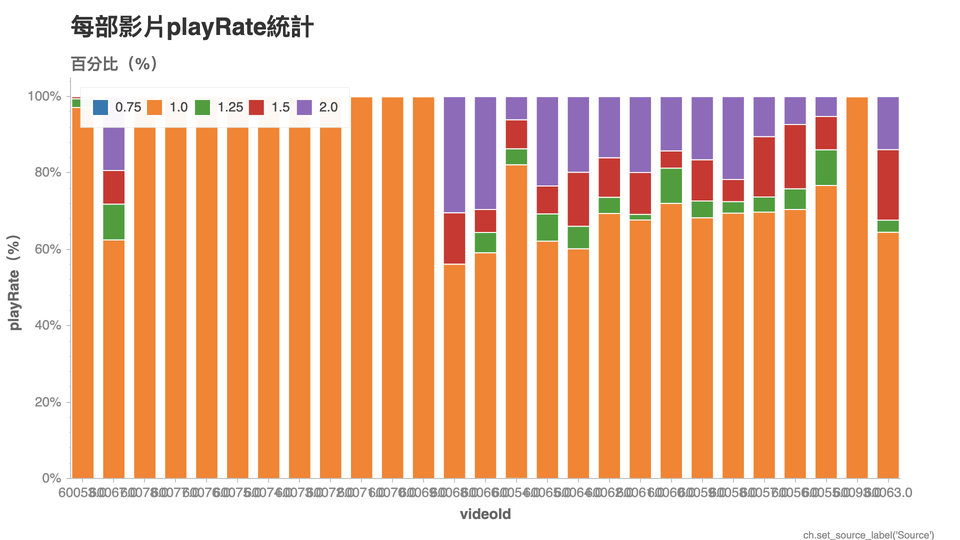

Saved to wow.png


,playRate,videoId,courseId
0,0.75,60054.0,1620
1,1.00,60053.0,277020
2,1.00,60054.0,5261760
3,1.00,60055.0,8918100
4,1.00,60056.0,2559600
5,1.00,60057.0,4226580
6,1.00,60058.0,1793340
7,1.00,60059.0,2694060
8,1.00,60060.0,1445040
9,1.00,60061.0,1401300


In [183]:
#資料視覺化2
ch = chartify.Chart(x_axis_type='categorical')
'''scatter '''
# ch.plot.scatter(
#     data_frame=videoR1_df, 
#     x_column='videoId', 
#     y_column='playRate'
# )
# ch.show('png')
# '''area'''
# ch.plot.area(
#     data_frame=videoR1_df, 
#     x_column='time', 
#     y_column='courseId', 
#     color_column='playRate', 
#     stacked = True)
# ch.show('png')
'''bar_stacked'''
# qq = videoR1_df.loc[:,['courseId','playRate','videoId']]

bar_data = (videoR1_df.groupby(['playRate','videoId'])[['courseId']].sum()
            .reset_index()
           )
bar_data
ch.plot.bar_stacked(
    data_frame= bar_data, 
    categorical_columns='videoId', 
    stack_column='playRate', 
    numeric_column='courseId', 
    normalize=True)
(ch.set_title('每部影片playRate統計')
 .set_subtitle('百分比（％）')
 .axes.set_xaxis_label('videoId')
 .axes.set_yaxis_label('playRate（％）')
 .show('png'))
ch.save('wow.png',format = 'png')

bar_data

[570, 2873, 4548, 3140, 3929, 8112, 9820]


Text(0,0.5,'count')

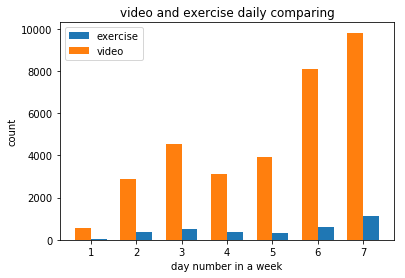

In [184]:
#資料視覺化3
import matplotlib.pyplot as plt
x = list(range(1,8))
class_a = list(ExeCountbyDay.values())
class_b = list(CountbyDay.values())
print(class_b)
plt.bar(x, class_a, label = 'exercise', align = "edge", width = 0.35)
plt.bar(x, class_b, label = 'video', align = "edge", width = -0.35)
plt.legend() #要使用label要加這行
plt.title("video and exercise daily comparing")
plt.xlabel("day number in a week")
plt.ylabel("count")


Text(0.5,1,'Counts of videos')

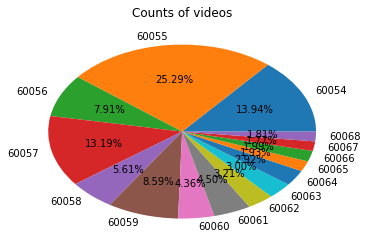

In [185]:
import matplotlib.pyplot as plt
x = []
for a in CountOfVideo:
    x.append(a['videoId'])
class_a = []
for a in CountOfVideo:
    class_a.append(a['count'])
plt.pie(class_a, labels = x, autopct = "%2.2f%%")
plt.title("Counts of videos")

Text(0,0.5,'count')

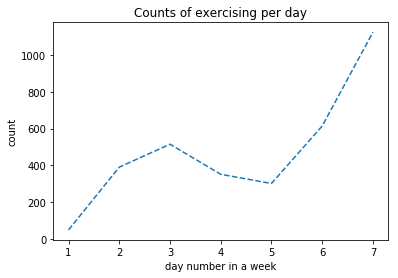

In [186]:
#資料視覺化4
x = []
class_a = []
x = list(range(1,8))
class_a = list(ExeCountbyDay.values())
plt.plot(x, class_a, linestyle = "--")
plt.title("Counts of exercising per day")
plt.xlabel("day number in a week")
plt.ylabel("count")

Text(0,0.5,'count')

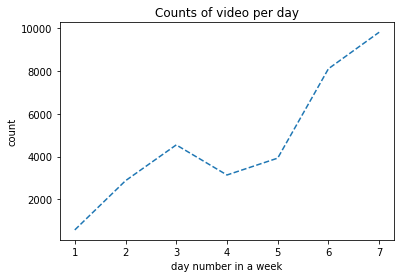

In [193]:
#資料視覺化5
x = []
class_a = []
x = list(range(1,8))
class_a = list(CountbyDay.values())
plt.plot(x, class_a, linestyle = "--")
plt.title("Counts of video per day")
plt.xlabel("day number in a week")
plt.ylabel("count")

In [188]:
StatisticForUid_df = pd.DataFrame(StatisticForUid)
StatisticForUid_df

,_v,eCompleteness,eCompletenessRank,exerciseCount,id,stack,sumExerciseCount,sumVideoCount,vCompleteness,vCompletenessRank,videoCount
0,0,0.000000,6,"{11806: 0, 11807: 0, 11808: 0, 11809: 0, 11810...",7089,1,0,0,0.000000,6,"{60054: 0, 60055: 0, 60056: 0, 60057: 0, 60058..."
1,0,0.000000,6,"{11806: 0, 11807: 0, 11808: 0, 11809: 0, 11810...",64785,1,0,0,0.000000,6,"{60054: 0, 60055: 0, 60056: 0, 60057: 0, 60058..."
2,0,0.000000,6,"{11806: 0, 11807: 0, 11808: 0, 11809: 0, 11810...",2891,1,0,0,0.000000,6,"{60054: 0, 60055: 0, 60056: 0, 60057: 0, 60058..."
3,0,0.000000,6,"{11806: 0, 11807: 0, 11808: 0, 11809: 0, 11810...",26979,1,0,0,0.000000,6,"{60054: 0, 60055: 0, 60056: 0, 60057: 0, 60058..."
4,0,0.000000,6,"{11806: 0, 11807: 0, 11808: 0, 11809: 0, 11810...",326,1,0,0,0.000000,6,"{60054: 0, 60055: 0, 60056: 0, 60057: 0, 60058..."
5,0,0.000000,6,"{11806: 0, 11807: 0, 11808: 0, 11809: 0, 11810...",38506,1,0,0,0.000000,6,"{60054: 0, 60055: 0, 60056: 0, 60057: 0, 60058..."
6,0,0.000000,6,"{11806: 0, 11807: 0, 11808: 0, 11809: 0, 11810...",57726,1,0,0,0.000000,6,"{60054: 0, 60055: 0, 60056: 0, 60057: 0, 60058..."
7,0,0.000000,6,"{11806: 0, 11807: 0, 11808: 0, 11809: 0, 11810...",144232,1,0,0,0.000000,6,"{60054: 0, 60055: 0, 60056: 0, 60057: 0, 60058..."
8,0,0.000000,6,"{11806: 0, 11807: 0, 11808: 0, 11809: 0, 11810...",11275,1,0,0,0.000000,6,"{60054: 0, 60055: 0, 60056: 0, 60057: 0, 60058..."
9,0,0.000000,6,"{11806: 0, 11807: 0, 11808: 0, 11809: 0, 11810...",38237,1,0,0,0.000000,6,"{60054: 0, 60055: 0, 60056: 0, 60057: 0, 60058..."


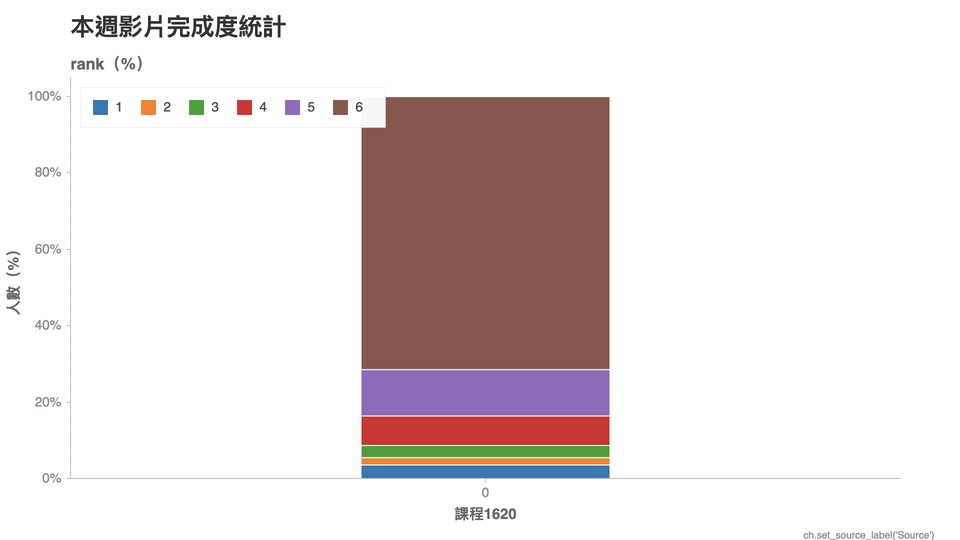

In [189]:
#資料視覺化6
ch = chartify.Chart(x_axis_type='categorical')


bar_data = (StatisticForUid_df.groupby(['vCompletenessRank','_v'])[['stack']].sum()
            .reset_index()
           )
bar_data
ch.plot.bar_stacked(
    data_frame= bar_data, 
    categorical_columns='_v', 
    stack_column='vCompletenessRank', 
    numeric_column='stack', 
    normalize=True)
(ch.set_title('本週影片完成度統計')
 .set_subtitle('rank（％）')
 .axes.set_xaxis_label('課程1620')
 .axes.set_yaxis_label('人數（％）')
 .show('png'))





Text(0,0.5,'correct rate')

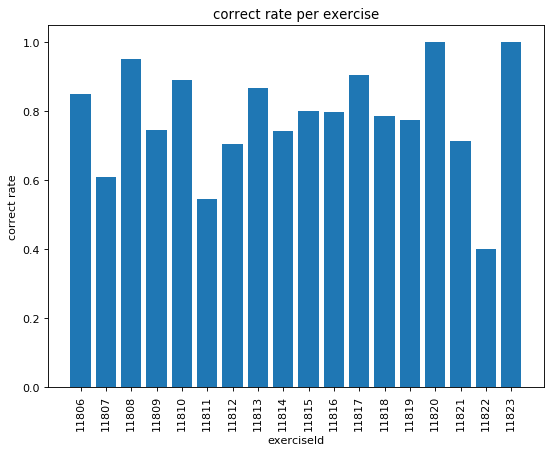

In [190]:
#資料視覺化7
from matplotlib.pyplot import figure
correctRate = {}
for a in exercise_id:
    correctCount = 0
    count = 0
    for b in exercise_R1:
        if b['exerciseId'] == a:
            if b['getScore'] == True:
                correctCount += 1
            count += 1
    correctRate[a] = correctCount / count
x = []
for a in correctRate.keys():
    x.append(str(a))
figure(num=None, figsize=(8, 6), dpi=80, facecolor='w', edgecolor='k')

plt.bar(x, list(correctRate.values()), align = "center")
plt.xticks(rotation=90)


plt.title("correct rate per exercise")
plt.xlabel("exerciseId")
plt.ylabel("correct rate")

In [191]:
# import csv
# with open(str(courseId)+'_report_week1.csv', 'w',encoding='utf_8_sig', newline='') as csvfile:
#     fieldnames = StatisticForUid[0].keys()
#     writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
#     writer.writerow({"id":"StatisticForUid"})
#     writer.writeheader()
#     for item in StatisticForUid:
#         writer.writerow(item)

In [192]:
import csv


              
with open(str(courseId)+'_report_week1.csv', 'w',encoding='utf_8_sig', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow([course_name])
    writer.writerow(['platformID','1'])
    writer.writerow(['courseID',courseId])
    writer.writerow(['chapterID',chid[WeekNumber]])
    writer.writerow(['Week number',WeekNumber])
    writer.writerow(['The number of videos',video_R1[0]['chapterVideoCount']])
    writer.writerow('')
    
    fieldnames = StatisticForUid[0].keys()
    writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
    writer.writerow({"id":"Statistic For user id"})
    writer.writeheader()
    for item in StatisticForUid:
        writer.writerow(item)
        
        
  
        
    
    
        
    fieldnames = totalTimebyWeek.keys()
    writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
    writer.writerow({"0":"layer2"})
#     writer.writerow({"0":"totalTimebyWeek"})
#     writer.writeheader()
#     writer.writerow(totalTimebyWeek)
    writer.writerow({"0":"VideoCountbyWeek"})
    #writer.writeheader()
    writer.writerow(CountbyWeek)
    writer.writerow({"0":"ExeCountbyWeek"})
#     writer.writeheader()
    writer.writerow(ExeCountbyWeek)
    writer.writerow({"0":"ScorebyWeek"})
#     writer.writeheader()
    writer.writerow(ScorebyWeek)
#     writer.writerow({"0":"KmapCountbyWeek"})
#     writer.writeheader()
#     writer.writerow(KmapCountbyWeek)
    
    fieldnames = totalTimebyDay.keys()
    writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
#     writer.writerow({"0":"totalTimebyDay"})
#     writer.writeheader()
#     writer.writerow(totalTimebyDay)
    writer.writerow({"0":"VideoCountbyDay"})
    writer.writeheader()
    writer.writerow(CountbyDay)
    
    fieldnames = CountOfVideo[0].keys()
    writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
    writer.writerow({"videoId":"CountOfVideo"})
    for item in CountOfVideo:
        writer.writerow(item)
    if exercise_R1:
        fieldnames = ExeCountbyDay.keys()
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writerow({"0":"ExeCountbyDay"})
        writer.writeheader()
        writer.writerow(ExeCountbyDay)
        fieldnames = CountOfExe[0].keys()
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writerow({"exerciseId":"CountOfExe"})
        for item in CountOfExe:
            writer.writerow(item)
    
            
#     fieldnames = videoProcrastination.keys()
#     writer = csv.DictWriter(csvfile, fieldnames=fieldnames) 
#     writer.writeheader()
#     writer.writerow(videoProcrastination)
        
    
              